In [95]:
import os
import numpy as np
import matplotlib.pyplot as plt

import torch
import torch.nn.functional as F
from torch.utils.data import Dataset, TensorDataset
import gymnasium as gym

from astropy.io import fits
from datetime import datetime, timezone
import pandas as pd
import json
import fitsio
import time
import pickle
import re

%reload_ext autoreload
%autoreload 2

In [2]:
import survey_ops
from survey_ops.utils import units, geometry, interpolate
from survey_ops.coreRL.offline_dataset import OfflineDECamDataset
from survey_ops.coreRL.agents import Agent
from survey_ops.algorithms import DDQN, BehaviorCloning
from survey_ops.utils.sys_utils import seed_everything
from survey_ops.coreRL.data_processing import load_raw_data_to_dataframe


In [3]:
from survey_ops.utils import ephemerides
from tqdm import tqdm
from pathlib import Path

In [92]:
from sklearn.neighbors import NearestNeighbors
from sklearn.cluster import KMeans
from collections import Counter
from scipy.stats import entropy

In [4]:
SEED = 10
seed_everything(SEED)
torch.set_default_dtype(torch.float32)
device = torch.device(
    "cuda" if torch.cuda.is_available() else
    "cpu"   
)

# Load config and lookup files

In [5]:
with open('../configs/global_config.json', 'r') as f:
    glob_cfg = json.load(f)

In [6]:
with open('../experiment_results/az_config.json', 'r') as f:
    cfg_azel = json.load(f)
with open('../experiment_results/ra_config.json', 'r') as f:
    cfg_radec = json.load(f)

In [7]:
# with open(glob_cfg.get('paths.lookup_dir') + '/' + cfg.get('paths')['FIELD2NVISITS'], 'r') as f:
#     field2nvisits = json.load(f)
# with open(glob_cfg.get('paths.lookup_dir') + '/' + cfg.get('paths')['FIELD2NAME'], 'r') as f:
#     field2name = json.load(f)
# with open(glob_cfg.get('paths.lookup_dir') + '/' + cfg.get('paths')['FIELD2RADEC'], 'r') as f:
#     field2radec = json.load(f)
with open('../data/lookups/nside16_bin2azel.json', 'r') as f:
    bin2azel = json.load(f)
with open('../data/lookups/nside16_bin2radec.json', 'r') as f:
    bin2radec = json.load(f)


In [9]:
# fits_path = Path(cfg.get('paths.DFITS')).resolve().parents[1] / 'data' / cfg.get('paths.DFITS')
# json_path = Path(cfg.get('paths.DJSON')).resolve().parents[1] / 'data' / cfg.get('paths.DJSON')

df = load_raw_data_to_dataframe(fits_path=None, json_path='../data/fits/decam-exposures-20251211.json')

cfg_azel['data']['specific_years'] = None
cfg_azel['data']['specific_months'] = None
cfg_azel['data']['specific_days'] = None
cfg_azel['data']['include_bin_features'] = False
cfg_radec['data']['specific_years'] = None
cfg_radec['data']['specific_months'] = None
cfg_radec['data']['specific_days'] = None
cfg_radec['data']['include_bin_features'] = False

rd_dat = OfflineDECamDataset(
    df=df,
    cfg=cfg_radec,
    glob_cfg=glob_cfg,
)

ae_dat = OfflineDECamDataset(
    df=df,
    cfg=cfg_azel,
    glob_cfg=glob_cfg,
)

Calculating zenith states: 100%|███████████████████████████████████████████████████████████████████████████████████████████| 647/647 [00:03<00:00, 202.21it/s]
Calculating bin features for all healpix bins and timestamps: 100%|████████████████████████████████████████████████| 83010/83010 [00:00<00:00, 9825295.60it/s]
Normalizing bin features: 0it [00:00, ?it/s]
Calculating zenith states: 100%|███████████████████████████████████████████████████████████████████████████████████████████| 647/647 [00:03<00:00, 200.69it/s]
Calculating bin features for all healpix bins and timestamps: 100%|███████████████████████████████████████████████| 83010/83010 [00:00<00:00, 10041796.70it/s]
Normalizing bin features: 0it [00:00, ?it/s]


# Action distribution

## azel

### Histograms: Bin history overall, by year, by month

In [375]:
# Count bins with < 100 examples
ae_actions = ae_dat.actions.detach().numpy()
unique_bin_ids, bin_counts = np.unique(ae_actions, return_counts=True)
rare_bins = sum(1 for count in bin_counts if count < 50)
print(f"Bins with <50 examples: {rare_bins}/{ae_dat.num_actions}={rare_bins / ae_dat.num_actions}")

Bins with <50 examples: 138/1504=0.09175531914893617


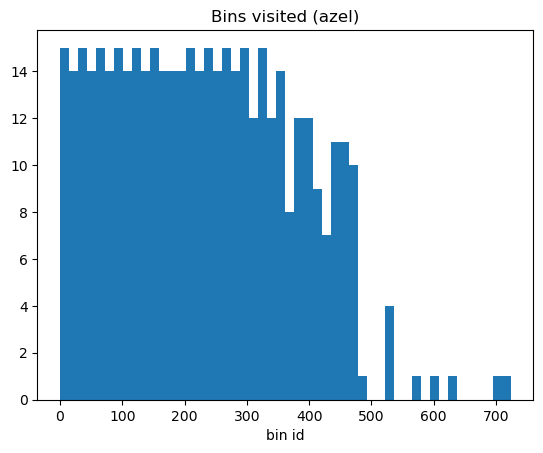

In [376]:
plt.hist(unique_bin_ids, bins=50);
plt.title('Bins visited (azel)')
plt.xlabel('bin id')
plt.savefig('dataset-wide-plots/azel/expert_bins_visited_histogram.png')


In [377]:
print('Fraction of all bins that equal next bin', np.count_nonzero(ae_dat._df['bin'][:-1].values == ae_dat._df['bin'][1:].values) / len(ae_dat._df['bin']))
print('Fraction of bins visited in entire dataset', len(unique_bin_ids)/ae_dat.num_actions)


Fraction of all bins that equal next bin 0.4021202264787375
Fraction of bins visited in entire dataset 0.29720744680851063


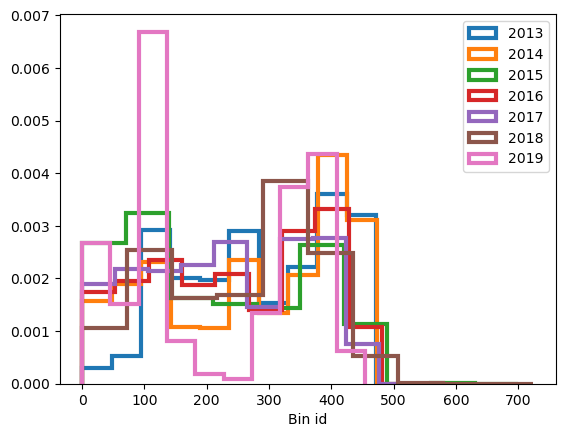

In [378]:
years = ae_dat._df['datetime'].dt.year.unique()
for year in years:
    _actions = ae_dat._df['bin'][ae_dat._df['datetime'].dt.year == year].values
    plt.hist(_actions, histtype='step', label=year, lw=3, density=True)
plt.legend()
plt.xlabel('Bin id')
plt.savefig('dataset-wide-plots/azel/expert_bins_visited_histogram_split_years.png')

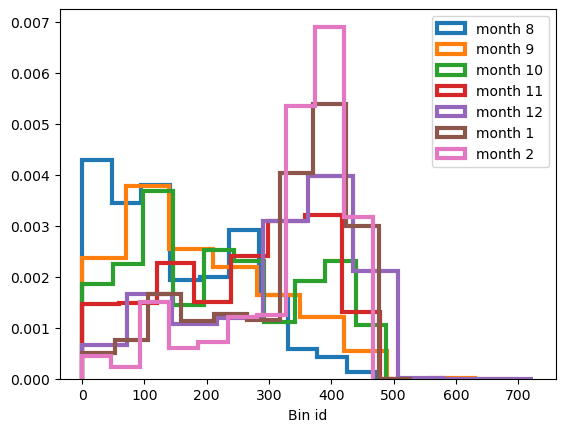

In [379]:
months = ae_dat._df['datetime'].dt.month.unique()

for month in months:
    _actions = ae_dat._df['bin'][ae_dat._df['datetime'].dt.month == month].values
    plt.hist(_actions, histtype='step', label= 'month ' + str(month), lw=3, density=True)
plt.legend()
plt.xlabel('Bin id')
plt.savefig('dataset-wide-plots/azel/expert_bins_visited_histogram_split_months.png')

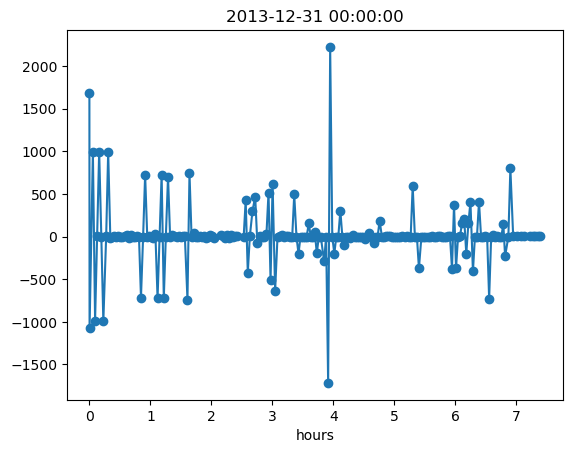

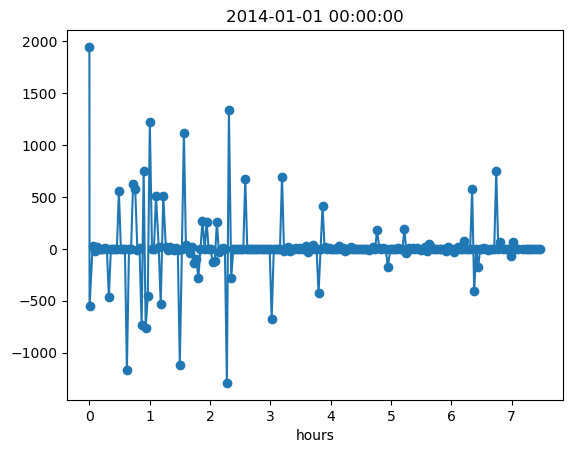

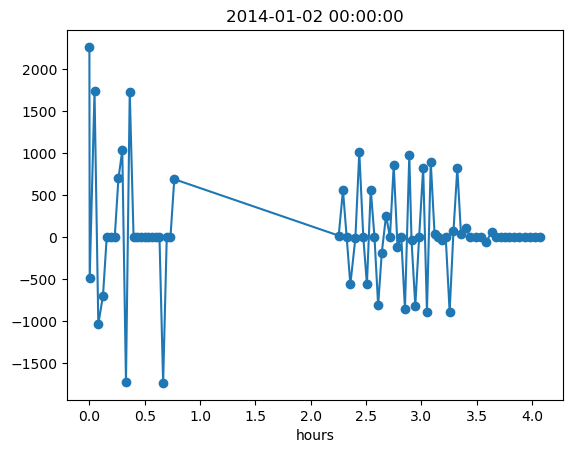

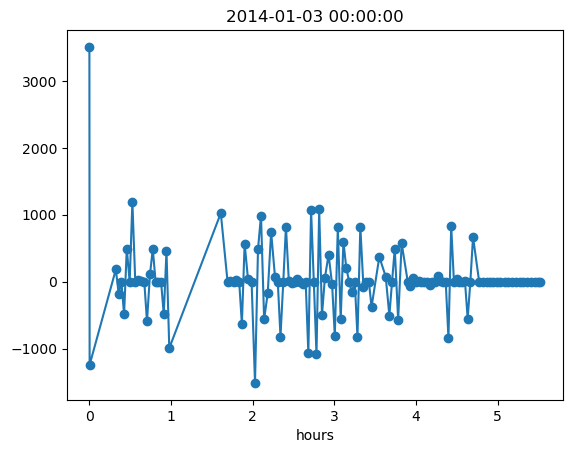

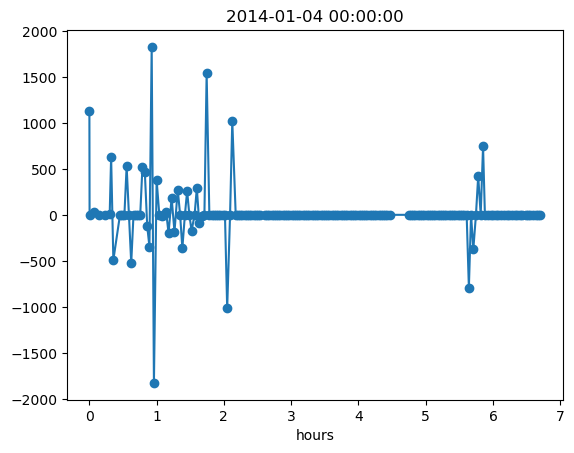

...

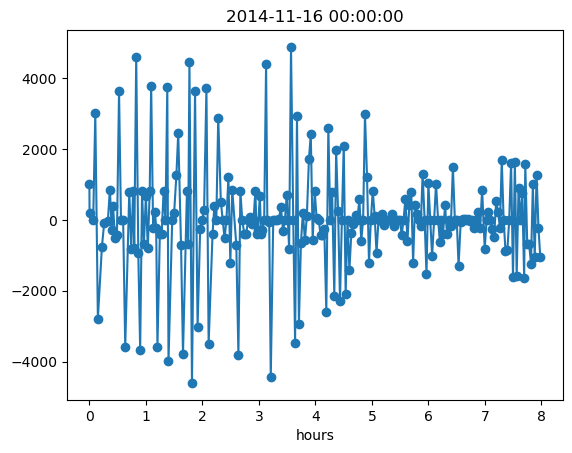

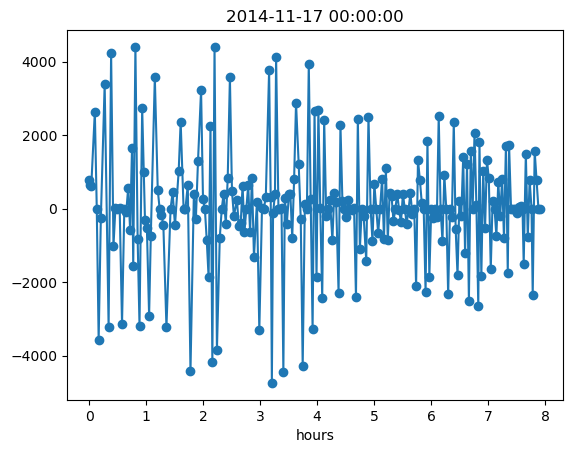

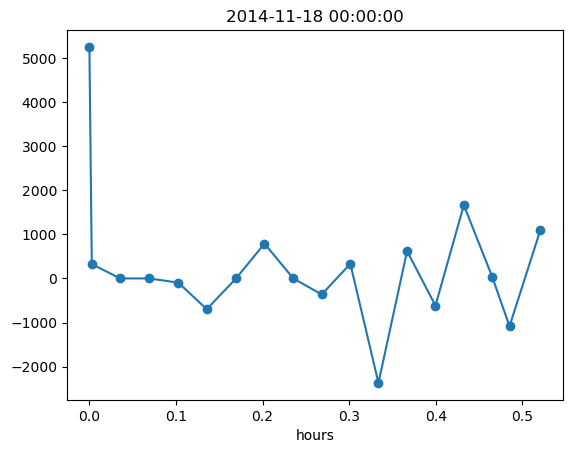

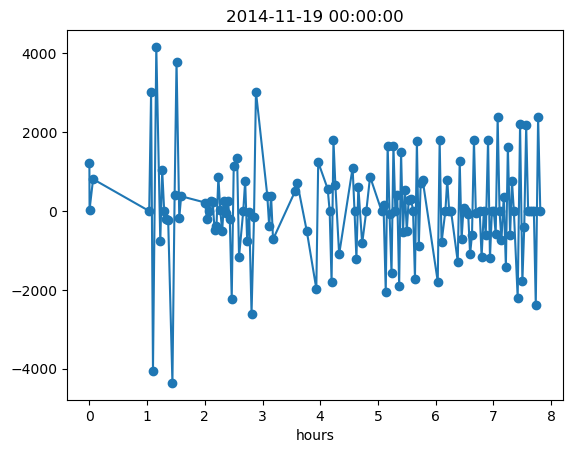

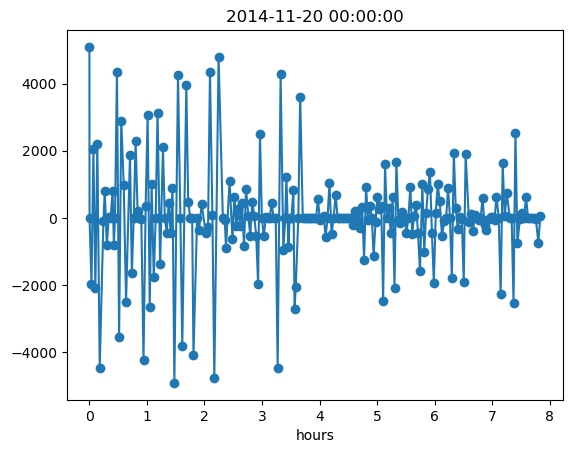

KeyboardInterrupt: 

In [380]:
for i, (night, group) in enumerate(ae_dat._df.groupby('night')):
    if group['datetime'].dt.year.values[0] == 2013:
        continue
    tstart = group['timestamp'].min()
    time_since_start = (group['timestamp'].values - tstart)/3600
    plt.plot(time_since_start[:-1], np.diff(group['field_id'].values.astype(np.int32)), marker='o')
    plt.title(night)
    plt.xlabel('hours')
    plt.show()
    if i == 0:
        break


In [381]:
step = 1
num_same_visit_twice = np.count_nonzero(ae_dat._df['field_id'].values.astype(np.int32)[:-1:step] == ae_dat._df['field_id'].values.astype(np.int32)[1::step])
num_same_visit_thrice = np.count_nonzero(ae_dat._df['field_id'].values.astype(np.int32)[:-2:step] == ae_dat._df['field_id'].values.astype(np.int32)[2::step])
num_same_visit_four = np.count_nonzero(ae_dat._df['field_id'].values.astype(np.int32)[:-3:step] == ae_dat._df['field_id'].values.astype(np.int32)[3::step])


In [382]:
print(f"Field is visited 2x consecutively {100*num_same_visit_twice/len(ae_dat):.2f}% of the time")
print(f"Field is visited 3x consecutively {100*num_same_visit_thrice/len(ae_dat):.2f}% of the time")
print(f"Field is visited 4x consecutively {100*num_same_visit_four/len(ae_dat):.2f}% of the time")

Field is visited 2x consecutively 21.18% of the time
Field is visited 3x consecutively 5.60% of the time
Field is visited 4x consecutively 0.49% of the time


All special fields are probably removed

### Bins visited scatter plots (azel)

In [383]:
visited_bins_azels = np.array([bin2azel[str(bid)] for bid in ae_actions])

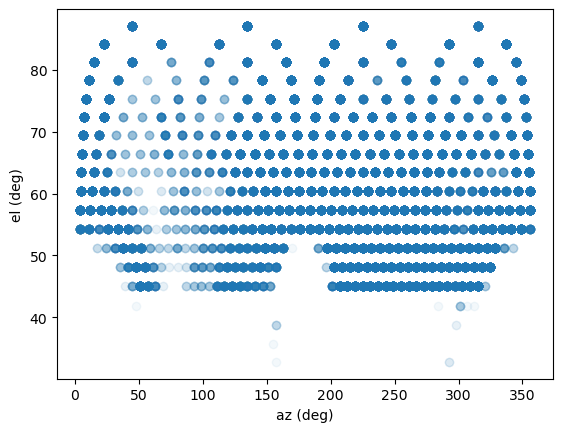

In [384]:
plt.scatter(visited_bins_azels[:, 0]/units.deg, visited_bins_azels[:, 1]/units.deg, alpha=.05)
plt.xlabel('az (deg)')
plt.ylabel('el (deg)')
plt.savefig('dataset-wide-plots/azel/expert_bins_visited_scatter_sky.png')

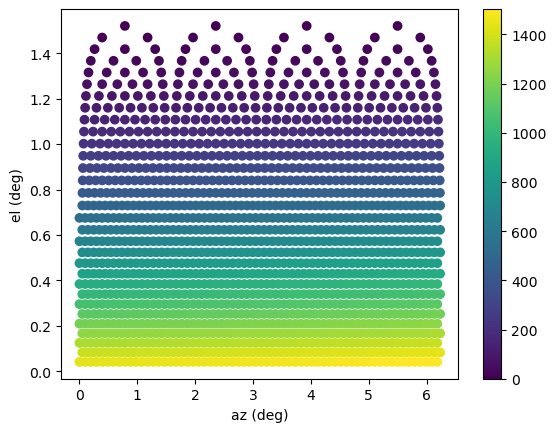

In [385]:
c = plt.scatter(ae_dat.hpGrid.lon, ae_dat.hpGrid.lat, c=np.arange(len(ae_dat.hpGrid.lat)))
plt.colorbar(c)
plt.xlabel('az (deg)')
plt.ylabel('el (deg)')
plt.savefig('dataset-wide-plots/azel/healpixbins_scattered_colored_by_id.png')

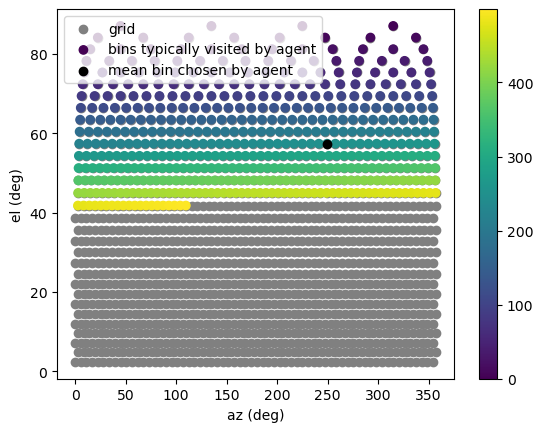

In [386]:
c = plt.scatter(ae_dat.hpGrid.lon/units.deg, ae_dat.hpGrid.lat/units.deg, color='grey', label='grid')
c = plt.scatter(ae_dat.hpGrid.lon[:500]/units.deg, ae_dat.hpGrid.lat[:500]/units.deg, c=np.arange(len(ae_dat.hpGrid.lat[:500])), label='bins typically visited by agent')
plt.scatter(ae_dat.hpGrid.lon[250]/units.deg, ae_dat.hpGrid.lat[250]/units.deg, color='black', label='mean bin chosen by agent')
plt.legend()
plt.colorbar(c)
plt.xlabel('az (deg)')
plt.ylabel('el (deg)')
plt.savefig('dataset-wide-plots/azel/healpixbins_scattered_colored_by_id.png')

In [387]:
# Angular spearation between consecutive observed bins
pos1 = visited_bins_azels[:-1, :].T
pos2 = visited_bins_azels[1:, :].T
visited_bins_ang_seps = geometry.angular_separation(pos1, pos2)

In [388]:
# Mean healpix angular separation
lonlat = np.array((ae_dat.hpGrid.lon, ae_dat.hpGrid.lat))
pos1 = lonlat[:, :-1]
pos2 = lonlat[:, 1:]
ang_seps = geometry.angular_separation(pos1=pos1, pos2=pos2)
mean_healpix_ang_sep = ang_seps.mean()

Text(0.5, 0, 'angular separations (deg)')

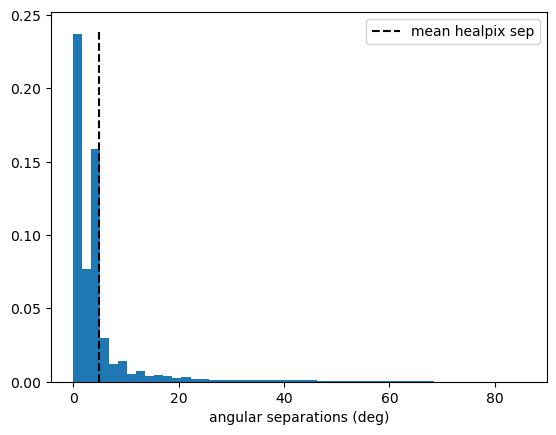

In [389]:
plt.hist(visited_bins_ang_seps/units.deg, bins=50, density=True)
plt.vlines(x=mean_healpix_ang_sep/units.deg, ymin=0, ymax=.24, color='black', linestyle='dashed', label='mean healpix sep')
plt.legend()
plt.xlabel('angular separations (deg)')

### Coverage Analysis

In [390]:
import seaborn as sns

In [391]:
ae_dat.states.shape

torch.Size([81649, 22])

<Axes: >

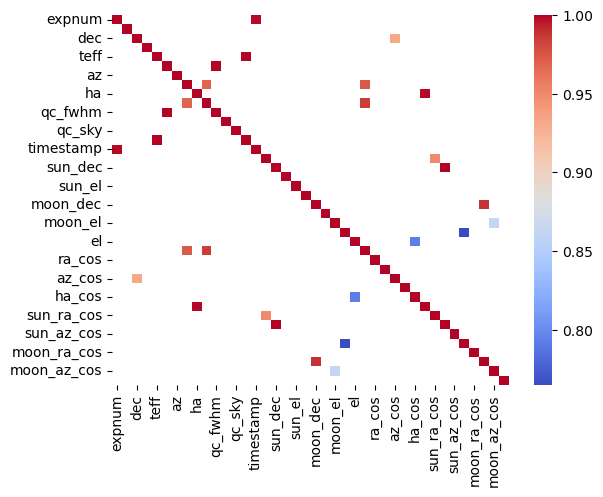

In [392]:
sns.heatmap(ae_corr[ae_corr > .7], annot=False, cmap='coolwarm')

<Axes: >

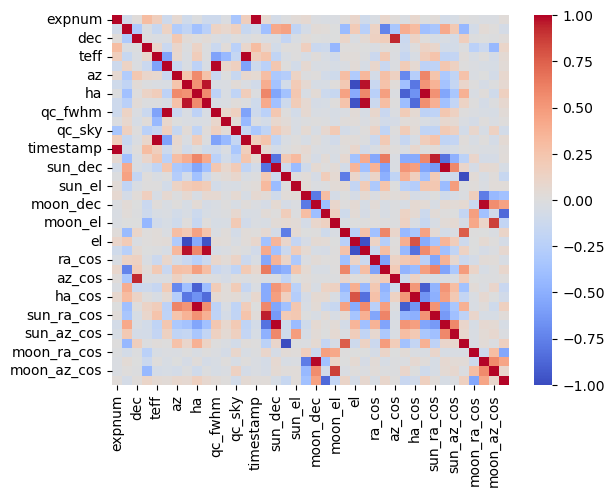

In [393]:
ae_corr = ae_dat._df.corr(numeric_only=True)
sns.heatmap(ae_corr, annot=False, cmap='coolwarm')

## radec

### Histograms: Bin history overall, by year, by month

In [403]:
# Count bins with < 100 examples
rd_actions = rd_dat.actions.detach().numpy()
unique_bin_ids, bin_counts = np.unique(rd_actions, return_counts=True)
rare_bins = sum(1 for count in bin_counts if count < 50)
print(f"Bins with <50 examples: {rare_bins}/{ae_dat.num_actions}={rare_bins / rd_dat.num_actions}")

Bins with <50 examples: 69/1504=0.0224609375


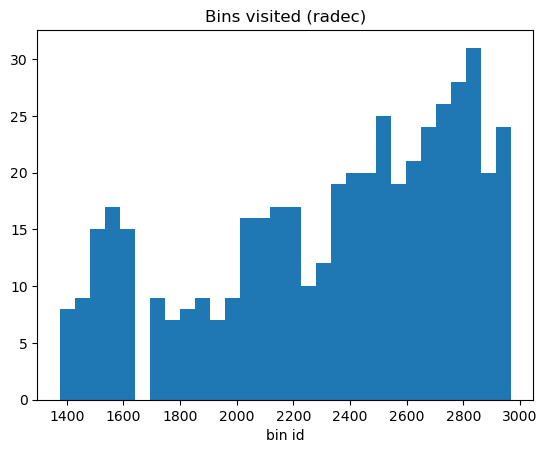

In [404]:
plt.hist(unique_bin_ids, bins=30);
plt.title('Bins visited (radec)')
plt.xlabel('bin id')
plt.savefig('dataset-wide-plots/radec/expert_bins_visited_histogram.png')


In [405]:
print('Fraction of all bins that equal next bin', np.count_nonzero(rd_dat._df['bin'][:-1].values == rd_dat._df['bin'][1:].values) / len(rd_dat._df['bin']))
print('Fraction of bins visited in entire dataset', len(unique_bin_ids)/rd_dat.num_actions)


Fraction of all bins that equal next bin 0.4322370798698952
Fraction of bins visited in entire dataset 0.15559895833333334


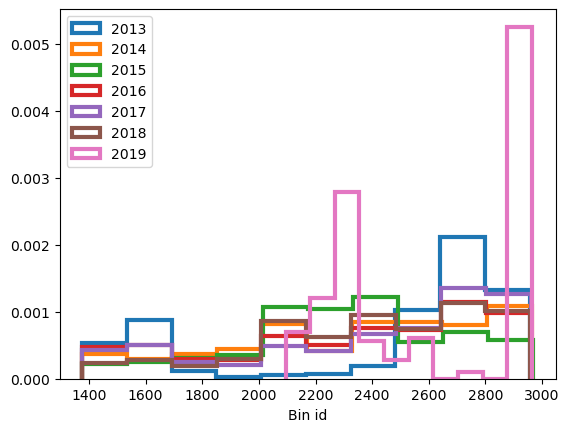

In [406]:
years = rd_dat._df['datetime'].dt.year.unique()
for year in years:
    _actions = rd_dat._df['bin'][rd_dat._df['datetime'].dt.year == year].values
    plt.hist(_actions, histtype='step', label=year, lw=3, density=True)
plt.legend()
plt.xlabel('Bin id')
plt.savefig('dataset-wide-plots/radec/expert_bins_visited_histogram_split_years.png')

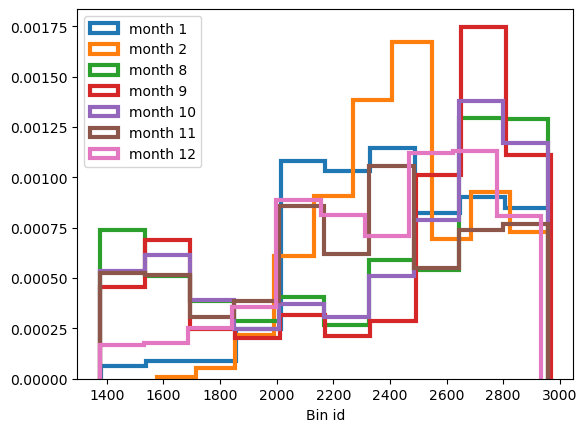

In [408]:
months = np.sort(rd_dat._df['datetime'].dt.month.unique())
for month in months:
    _actions = rd_dat._df['bin'][rd_dat._df['datetime'].dt.month == month].values
    plt.hist(_actions, histtype='step', label= 'month ' + str(month), lw=3, density=True)
plt.legend()
plt.xlabel('Bin id')
plt.savefig('dataset-wide-plots/azel/expert_bins_visited_histogram_split_months.png')

In [409]:
step = 1
num_same_visit_twice = np.count_nonzero(rd_dat._df['field_id'].values.astype(np.int32)[:-1:step] == rd_dat._df['field_id'].values.astype(np.int32)[1::step])
num_same_visit_thrice = np.count_nonzero(rd_dat._df['field_id'].values.astype(np.int32)[:-2:step] == rd_dat._df['field_id'].values.astype(np.int32)[2::step])

In [410]:
print(f"Field is visited twice in a row {num_same_visit_twice/len(ae_dat):.2f}% of the time")
print(f"Field is visited twice in a row {num_same_visit_thrice/len(ae_dat):.2f}% of the time")


Field is visited twice in a row 0.21% of the time
Field is visited twice in a row 0.06% of the time


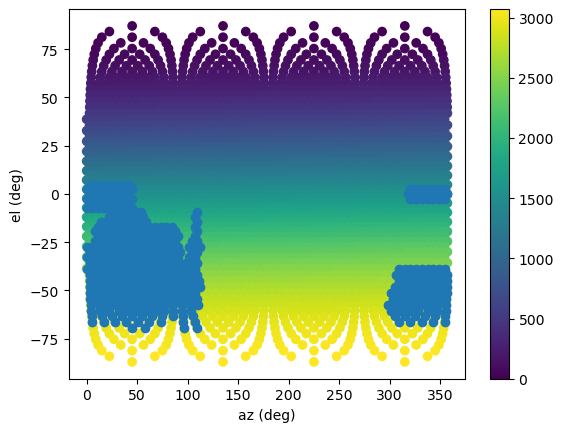

In [417]:
_bin_radecs_actually_visited = np.array([bin2radec[str(bid)] for bid in unique_bin_ids])
c = plt.scatter(rd_dat.hpGrid.lon/units.deg, rd_dat.hpGrid.lat/units.deg, c=np.arange(len(rd_dat.hpGrid.lat)))
plt.scatter(_bin_radecs_actually_visited[:, 0]/units.deg, _bin_radecs_actually_visited[:, 1]/units.deg)
plt.colorbar(c)
plt.xlabel('az (deg)')
plt.ylabel('el (deg)')
plt.savefig('dataset-wide-plots/radec/healpixbins_scattered_colored_by_id.png')

### Action vs state

In [337]:
dataset.next_states

tensor([[ 0.5180, -0.8554, -0.5660,  ..., -0.8739, -0.7514,  0.0000],
        [ 0.5128, -0.8585, -0.5885,  ..., -0.8674, -0.7554,  0.0074],
        [ 0.5069, -0.8620, -0.6111,  ..., -0.8607, -0.7593,  0.0146],
        ...,
        [ 0.0790,  0.9969, -0.2427,  ..., -0.7093, -0.3413,  0.9313],
        [ 0.1204,  0.9927, -0.5064,  ..., -0.7019, -0.3461,  0.9721],
        [ 0.1202,  0.9927, -0.5183,  ..., -0.6967, -0.3493,  1.0000]])

In [165]:
alg = BehaviorCloning(obs_dim=dataset.obs_dim, num_actions=dataset.num_actions, hidden_dim=1024, loss_fxn="cross_entropy")
policy_net = alg.load('../experiment_results/bc-azel-best/best_weights.pt')

(array([ 4984.,  5797.,  3493.,  3692.,  8819.,  6962., 10287., 11263.,
        15895., 11837.]),
 array([1376. , 1535.2, 1694.4, 1853.6, 2012.8, 2172. , 2331.2, 2490.4,
        2649.6, 2808.8, 2968. ]),
 <BarContainer object of 10 artists>)

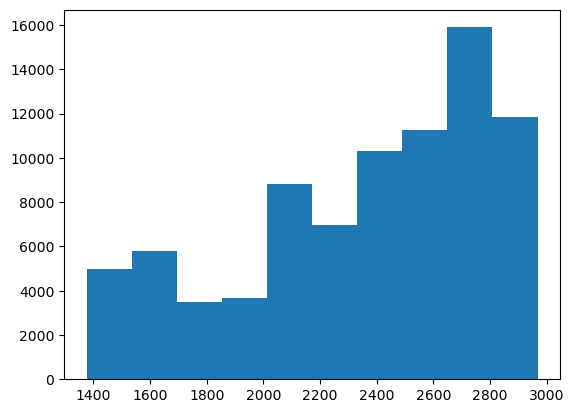

In [104]:
plt.hist(dataset._df['bin'].values)

In [106]:
from survey_ops.algorithms import setup_algorithm

In [117]:
hpGrid = ephemerides.HealpixGrid(nside=16, is_azel=True)

In [114]:
algorithm = setup_algorithm(save_dir='./', algorithm_name=cfg['model']['algorithm'], 
                            obs_dim=cfg['data']['obs_dim'], num_actions=cfg['data']['num_actions'], loss_fxn=cfg['model']['loss_function'],
                            hidden_dim=cfg['train']['hidden_dim'], lr=cfg['train']['lr'], lr_scheduler=cfg['train']['lr_scheduler'], 
                            device=device, lr_scheduler_kwargs=cfg['train']['lr_scheduler_kwargs'], lr_scheduler_epoch_start=cfg['train']['lr_scheduler_epoch_start'], 
                            lr_scheduler_num_epochs=cfg['train']['lr_scheduler_num_epochs'], gamma=cfg['model']['gamma'], 
                            tau=cfg['model']['tau'], activation=cfg['model']['activation'])

agent = Agent(
    algorithm=algorithm,
    train_outdir=cfg['metadata']['outdir'],
)
agent.load(cfg['metadata']['outdir'] + '/best_weights.pt')

In [124]:
# Plot predicted action for each state
with torch.no_grad():
    logits = agent.algorithm.policy_net(dataset.states.to(device))
    eval_actions = torch.argmax(logits, dim=1).to('cpu').detach().numpy()

    print(f"Logit stats: min={logits.min():.3f}, max={logits.max():.3f}, std={logits.std():.3f}")
    print(f"Top 5 logits: {logits.topk(5).values}")
    print(f"Top 5 bins: {logits.topk(5).indices}")

Logit stats: min=-81.935, max=26.222, std=7.402
Top 5 logits: tensor([[15.1552, 14.7649, 14.6848, 13.7786, 13.6647],
        [15.6249, 14.4760, 13.9208, 13.3328, 10.7754],
        [15.5354, 14.8340, 14.1434, 13.6398, 10.9726],
        ...,
        [16.6363, 16.2339, 15.4044, 15.3274, 14.9412],
        [17.4990, 17.4154, 16.5941, 15.6600, 15.6007],
        [18.4236, 17.8687, 17.2216, 16.5209, 15.5087]], device='cuda:0')
Top 5 bins: tensor([[1562, 2844, 1561, 1500, 2644],
        [2754, 2845, 2700, 2885, 2756],
        [2754, 2845, 2700, 2885, 2886],
        ...,
        [2158, 2159, 2349, 2095, 2094],
        [2158, 2159, 2095, 2094, 2349],
        [2606, 2665, 2544, 2542, 2664]], device='cuda:0')


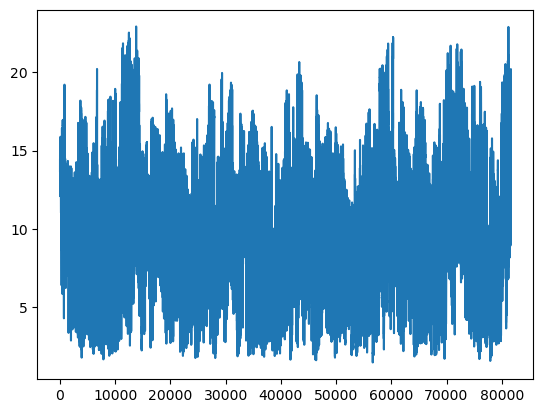

In [135]:
plt.plot(logits.topk(5).values.mean(axis=1).cpu().detach().numpy())

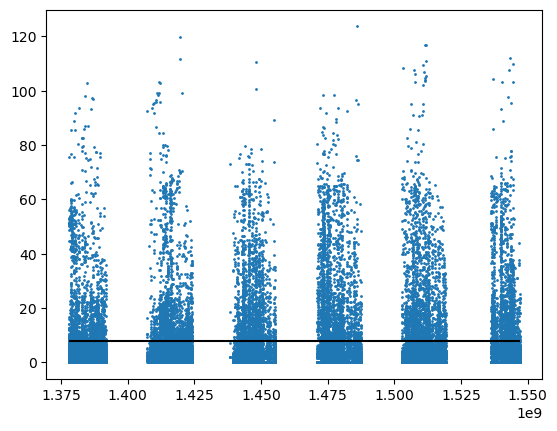

In [67]:
radec = np.array((df['ra'].values, df['dec'].values))*units.deg
pos1 = radec[:, :-1]
pos2 = radec[:, 1:]
ang_seps = geometry.angular_separation(pos1=pos1, pos2=pos2)
plt.scatter(df['timestamp'].values[1:], ang_seps/units.deg, s=1)
plt.hlines(y=.14/units.deg, xmin=np.min(df['timestamp']), xmax=np.max(df['timestamp']), color='black')

In [60]:
len(ang_seps[ang_seps < .04]) / len(ang_seps)

0.6520216851140728

In [64]:
.075 / units.deg

4.297183463481174

In [57]:
np.mean(ang_seps)

np.float64(0.07816551346883441)

/tmp/ipykernel_19933/2754210249.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots()


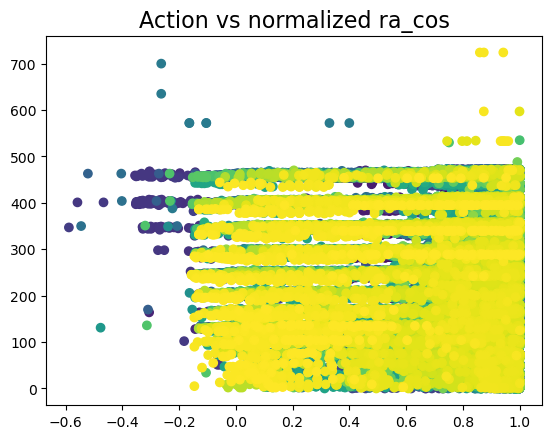

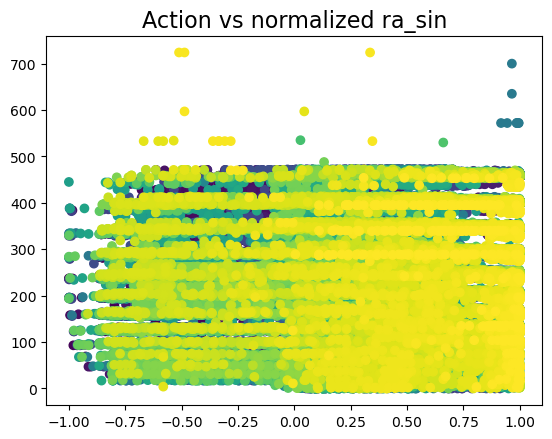

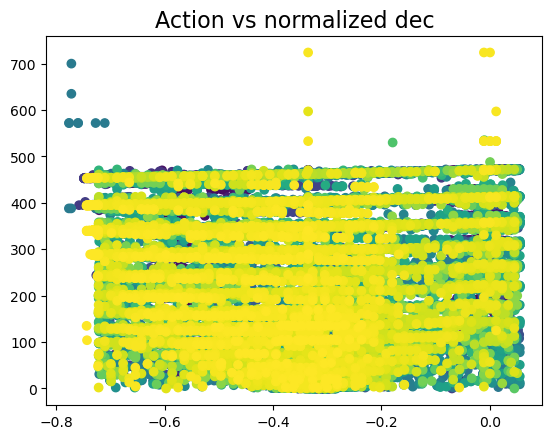

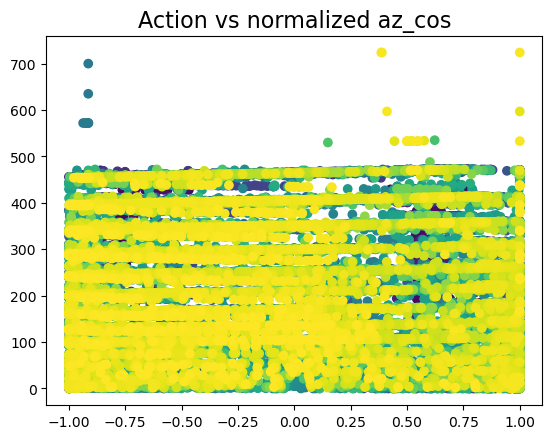

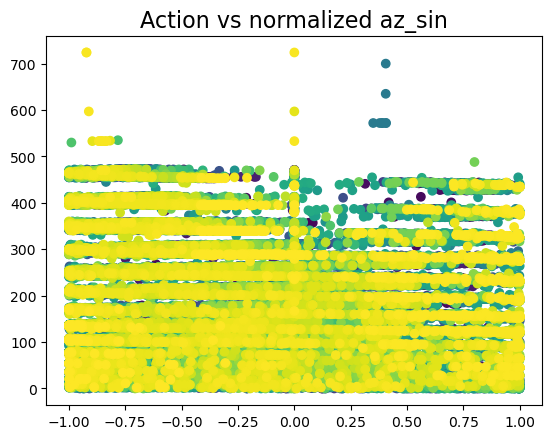

...

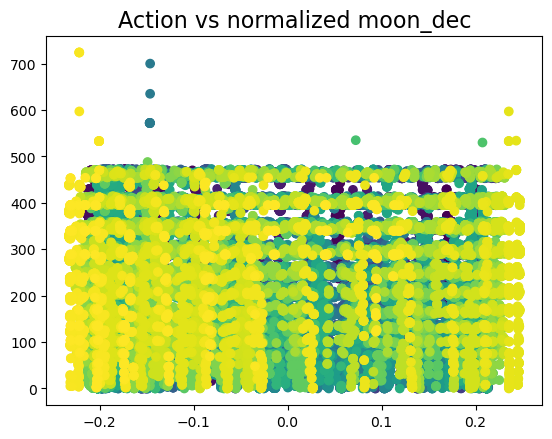

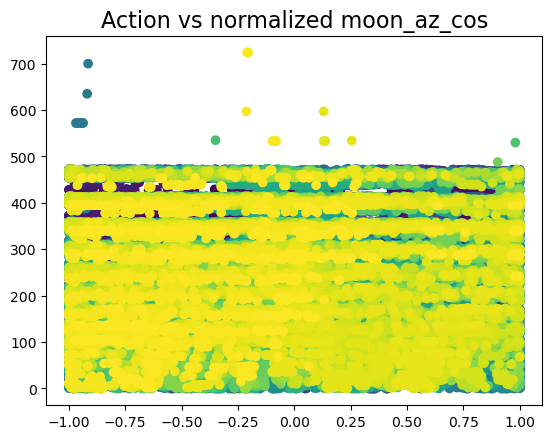

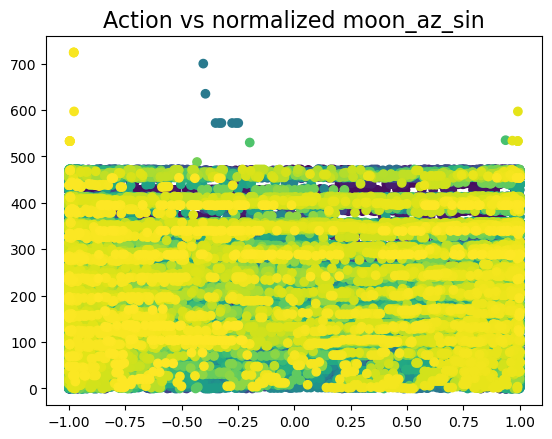

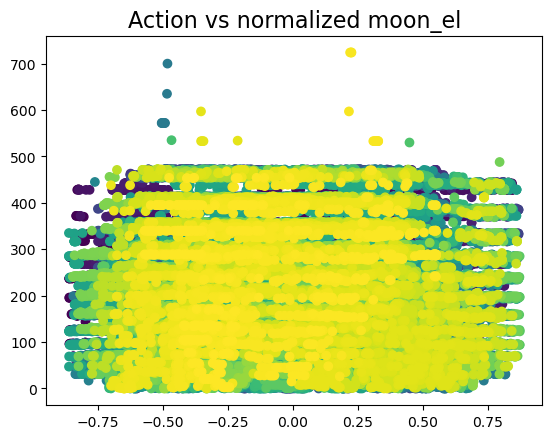

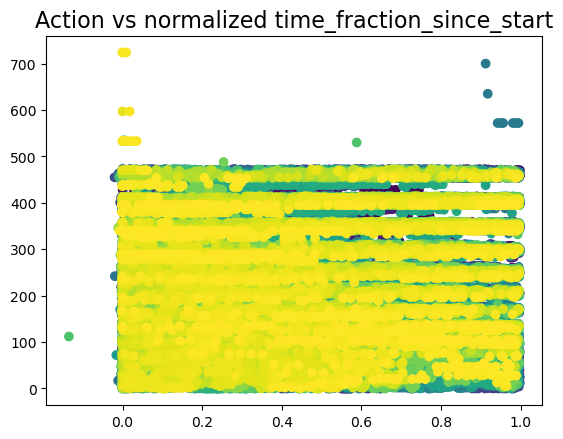

In [68]:
for i, feat_name in enumerate(ae_dat.state_feature_names):
    feature_row = ae_dat.states.T[i].detach().numpy()
    fig, ax = plt.subplots()
    ax.scatter(feature_row, ae_dat.actions, c=np.arange(len(feature_row)), label='chrononologically sorted')
    ax.set_title(f'Action vs normalized {feat_name}', fontsize=16)
    fig.savefig(f'./dataset-wide-plots/azel/expert_actions_vs_normalized_{feat_name}_scatter.png')

# Model evaluations

In [527]:
results_outdir = Path('../experiment_results/bc-azel-2015-2018/')
with open(results_outdir / 'train_metrics.pkl', 'rb') as f:
    train_metrics = pickle.load(f)
with open(results_outdir / 'val_metrics.pkl', 'rb') as f:
    val_metrics = pickle.load(f)
with open(results_outdir / 'val_train_metrics.pkl', 'rb') as f:
    val_train_metrics = pickle.load(f)
with open(results_outdir / 'config.json', 'r') as f:
    train_cfg = json.load(f)

In [528]:
train_dataset = OfflineDECamDataset(
    df=df,
    cfg=train_cfg,
    glob_cfg=glob_cfg
    )

Calculating zenith states: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 442/442 [00:01<00:00, 299.94it/s]


In [529]:
trainloader, valloader = train_dataset.get_dataloader(1024, num_workers=train_cfg['train']['num_workers'], pin_memory=True if device.type == 'cuda' else False, random_seed=train_cfg['metadata']['seed'], return_train_and_val=True)


(array([   35.,   900.,  2019.,  2559.,  2513.,  3097.,  4558.,  6497.,
        10289., 20685.]),
 array([-0.26289722, -0.13660751, -0.0103178 ,  0.11597189,  0.24226162,
         0.36855134,  0.49484101,  0.6211307 ,  0.74742043,  0.87371016,
         0.99999994]),
 <BarContainer object of 10 artists>)

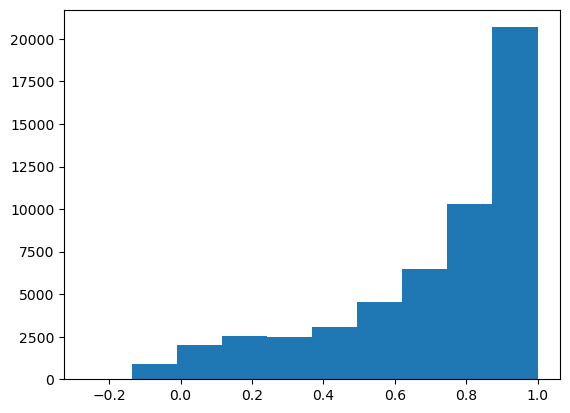

In [530]:
plt.hist(train_dataset.next_states[:, 0].detach().numpy())

In [531]:
train_states = train_dataset.next_states[trainloader.dataset.indices]
val_states = train_dataset.next_states[valloader.dataset.indices]


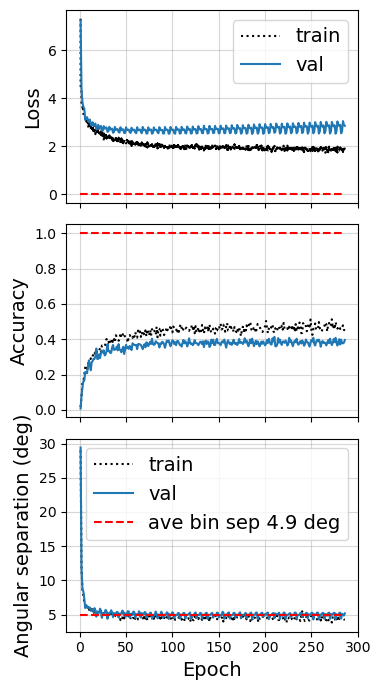

In [532]:
# Plot train and val loss
fig, axs = plt.subplots(3, sharex=True, figsize=(4, 7))

axs[0].plot(train_metrics['epoch'], train_metrics['train_loss'], label='train', color='black', linestyle='dotted')
axs[0].plot(val_metrics['epoch'], val_metrics['val_loss'], label='val')
axs[0].hlines(y=0, xmin=0, xmax=np.max(val_metrics['epoch']), color='red', linestyle='dashed')
axs[0].set_ylabel('Loss', fontsize=14)
axs[0].legend(fontsize=14)

axs[1].plot(val_train_metrics['epoch'], val_train_metrics['accuracy'], label='train', color='black', linestyle='dotted')
axs[1].plot(val_metrics['epoch'], val_metrics['accuracy'], label='val')
axs[1].hlines(y=1, xmin=0, xmax=np.max(train_metrics['epoch']), color='red', linestyle='dashed')
axs[1].set_ylabel('Accuracy', fontsize=14)
# axs[1].legend()

axs[2].plot(val_train_metrics['epoch'], np.array(val_train_metrics['ang_sep'])/units.deg, label='train', color='black', linestyle='dotted')
axs[2].plot(val_metrics['epoch'], np.array(val_metrics['ang_sep'])/units.deg, label='val')
axs[2].set_ylabel('Angular separation (deg)', fontsize=14)
axs[2].set_xlabel('Epoch', fontsize=14)
axs[2].hlines(y=average_bin_sep/units.deg, xmin=0, xmax=np.max(val_train_metrics['epoch']), label=f'ave bin sep {average_bin_sep/units.deg:.1f} deg', color='red', linestyle='dashed')
axs[2].legend(fontsize=14)
for ax in axs:
    ax.grid(True, alpha=.5)
fig.tight_layout()

In [533]:
from survey_ops.algorithms.factory import setup_algorithm

In [534]:
algorithm = setup_algorithm(save_dir='./', algorithm_name=train_cfg['model']['algorithm'], 
                            obs_dim=train_cfg['data']['obs_dim'], num_actions=train_cfg['data']['num_actions'], loss_fxn=train_cfg['model']['loss_function'],
                            hidden_dim=train_cfg['train']['hidden_dim'], lr=train_cfg['train']['lr'], lr_scheduler=train_cfg['train']['lr_scheduler'], 
                            device=device, lr_scheduler_kwargs=train_cfg['train']['lr_scheduler_kwargs'], lr_scheduler_epoch_start=train_cfg['train']['lr_scheduler_epoch_start'], 
                            lr_scheduler_num_epochs=train_cfg['train']['lr_scheduler_num_epochs'], gamma=train_cfg['model']['gamma'], 
                            tau=train_cfg['model']['tau'], activation=train_cfg['model']['activation'])

agent = Agent(
    algorithm=algorithm,
    train_outdir=train_cfg['metadata']['outdir'],
)
agent.load(train_cfg['metadata']['outdir'] + '/best_weights.pt')

In [535]:
# Plot predicted action for each state
with torch.no_grad():
    logits = agent.algorithm.policy_net(ae_dat.states.to(device))
    eval_actions = torch.argmax(logits, dim=1).to('cpu').detach().numpy()

    print(f"Logit stats: min={logits.min():.3f}, max={logits.max():.3f}, std={logits.std():.3f}")
    print(f"Top 5 logits: {logits.topk(5).values}")
    print(f"Top 5 bins: {logits.topk(5).indices}")

Logit stats: min=-149.657, max=24.883, std=13.391
Top 5 logits: tensor([[20.4550, 18.8908, 18.7517, 18.7023, 17.1414],
        [23.3252, 23.0226, 22.5340, 22.0949, 21.8181],
        [24.0194, 23.8983, 22.3333, 22.2436, 22.0752],
        ...,
        [10.2496,  8.8336,  8.3629,  7.8294,  7.1757],
        [ 9.5562,  8.4413,  8.3206,  8.3166,  7.9938],
        [12.2838, 12.2398, 11.4715, 11.3685, 10.1864]], device='cuda:0')
Top 5 bins: tensor([[334, 388, 125, 238, 285],
        [283, 238, 195, 194, 196],
        [283, 238, 195, 196, 333],
        ...,
        [136, 137, 106, 105, 171],
        [106, 137, 136,  79, 138],
        [132, 131, 101, 166, 204]], device='cuda:0')


In [536]:
el, c = np.unique(ae_dat.actions, return_counts=True)
train_el, train_c = np.unique(train_dataset.actions, return_counts=True)
el_agent, c_agent = np.unique(eval_actions, return_counts=True)

In [537]:
sort = np.argsort(c)[::-1]
sort_agent = np.argsort(c_agent)[::-1]
sort_train = np.argsort(train_c)[::-1]


In [538]:
c = c[sort]
el = el[sort]
c_agent = c_agent[sort_agent]
el_agent = el[sort_agent]
c_train = train_c[sort_train]
el_train = train_el[sort_train]

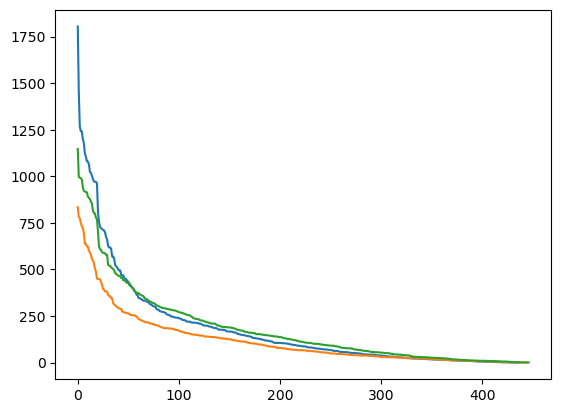

In [539]:
plt.plot(c_agent)
plt.plot(c_train)
plt.plot(c)

In [540]:
len(np.unique(el_train)) / len(ae_dat.hpGrid.lon)

0.2958776595744681

In [541]:
len(np.unique(el_agent)) / len(ae_dat.hpGrid.lon)

0.29055851063829785

In [542]:
len(np.unique(el)) / len(ae_dat.hpGrid.lon)

0.29720744680851063

In [543]:
number = 1000
agent_highest_azels = np.array([bin2azel[str(bid)] for bid in el_agent[:number]])
expert_highest_azels = np.array([bin2azel[str(bid)] for bid in el[:number]])


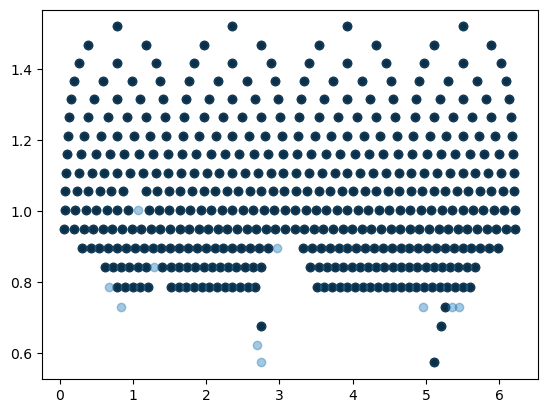

In [544]:
plt.scatter(agent_highest_azels[:, 0], agent_highest_azels[:, 1], alpha=1, color='black',)
plt.scatter(expert_highest_azels[:, 0], expert_highest_azels[:, 1], alpha=.4)


Text(0.5, 0, 'bin id')

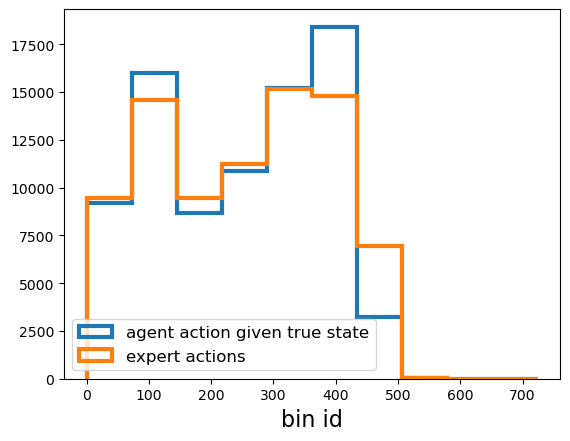

In [545]:
plt.hist(eval_actions, lw=3, histtype='step', label='agent action given true state')
plt.hist(ae_dat.actions.detach().numpy(), histtype='step', lw=3, label='expert actions')
plt.legend(fontsize=12, loc='lower left')
plt.xlabel('bin id', fontsize=16)

In [546]:
equal_mask = ae_actions == eval_actions

In [547]:
sort = np.sort(ae_actions)

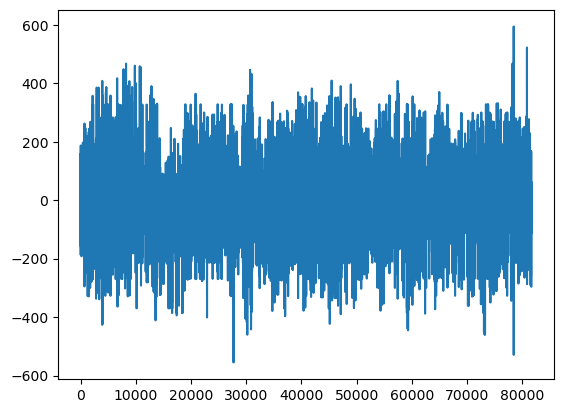

In [548]:
plt.plot(ae_actions - eval_actions)

In [549]:
agent_azel = np.array([bin2azel[str(a)] for a in eval_actions])
expert_azel = np.array([bin2azel[str(a)] for a in ae_actions])

In [550]:
ang_seps = geometry.angular_separation(agent_azel.T, expert_azel.T) / units.deg

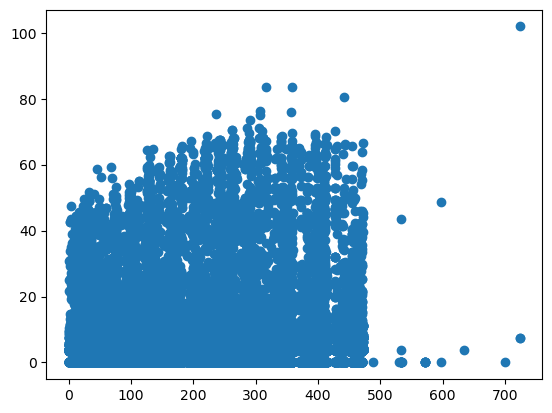

In [551]:
plt.scatter(ae_actions, ang_seps)

In [552]:
ang_seps_per_action = []
ang_std = []
for a in np.unique(ae_actions):
    m = ang_seps[ae_actions==a].mean()
    s = ang_seps[ae_actions==a].mean()
    ang_seps_per_action.append([a, m])
    ang_std.append([a, s])


In [553]:
ang_seps_per_action = np.array(ang_seps_per_action)
ang_std = np.array(ang_std)


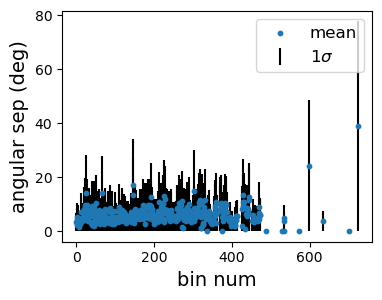

In [555]:
fig, ax = plt.subplots(figsize=(4,3))
plt.errorbar(
    x=ang_seps_per_action[:, 0],
    y=ang_seps_per_action[:, 1],
    yerr=ang_std[:, 1],
    ecolor='black',
    fmt='none',
    label=r'1$\sigma$'
)
ax.scatter(ang_seps_per_action[:, 0], ang_seps_per_action[:, 1], zorder=1000, s=10, label='mean')
ax.set_xlabel('bin num', fontsize=14)
ax.set_ylabel('angular sep (deg)', fontsize=14)
ax.legend(fontsize=12)

In [ ]:
1

# Do similar states lead to similar actions?

In [419]:
ae_states_np = ae_dat.states.detach().numpy()
ae_actions_np = ae_dat.actions.detach().numpy()

## K-means clustering

In [420]:
def kmeans_analysis(states, actions, n_clusters=10, is_discrete=True):
    kmeans = KMeans(n_clusters=n_clusters)
    cluster_labels = kmeans.fit_predict(states)
    results = []
    cluster_info = {}
    cluster_info.update({'cluster_labels': cluster_labels})
    # 3. Analyze actions within each cluster
    for i in range(n_clusters):
        cluster_mask = (cluster_labels == i)
        cluster_actions = actions[cluster_mask]
        cluster_size = np.sum(cluster_mask)
        cluster_info.update({i: {'actions': cluster_actions, 'cluster_mask': cluster_mask}})
        if cluster_size == 0:
            continue
            
        if is_discrete:
            # Calculate Shannon Entropy for discrete actions
            _, counts = np.unique(cluster_actions, return_counts=True)
            probs = counts / cluster_size
            action_metric = entropy(probs)
            metric_name = "Entropy"
        else:
            # Calculate Variance for continuous actions
            action_metric = np.var(cluster_actions, axis=0).mean()
            metric_name = "Avg Variance"
            
        results.append({
            "Cluster": i,
            "Size": cluster_size/len(states),
            metric_name: round(action_metric, 4),
            "Centroid_Sample": kmeans.cluster_centers_[i][:3] # First 3 features for preview
        })
        
    return pd.DataFrame(results).sort_values(by=metric_name, ascending=False), kmeans, cluster_info

In [421]:
n_clusters = 10
kmeans_results, kmeans, cluster_info = kmeans_analysis(states=ae_states_np, actions=ae_actions_np, n_clusters=n_clusters)

In [422]:
kmeans_results['Size'].min()

0.08248723193180565

In [423]:
from sklearn.decomposition import PCA
from mpl_toolkits.mplot3d import Axes3D # Required for 3D projection

In [365]:
pca = PCA(n_components=2)
states_2d = pca.fit_transform(ae_dat.states.detach().numpy())
pca = PCA(n_components=3)
states_3d = pca.fit_transform(ae_dat.states.detach().numpy())

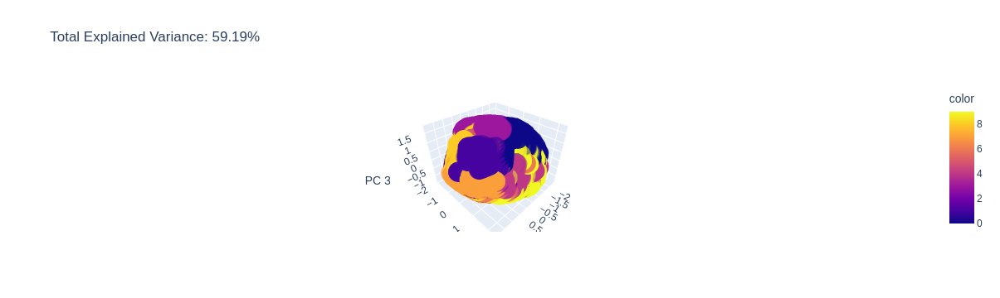

In [366]:
import plotly.express as px

# Create the interactive 3D plot
fig = px.scatter_3d(
    states_3d,
    x=0,
    y=1,
    z=2,
    color=cluster_info['cluster_labels'], # Color by species
    title=f'Total Explained Variance: {pca.explained_variance_ratio_.sum() * 100:.2f}%',
    labels={'0': 'PC 1', '1': 'PC 2', '2': 'PC 3'},
    size_max=1,
    opacity=.5
)
fig.show() # This will open an interactive plot in your browser


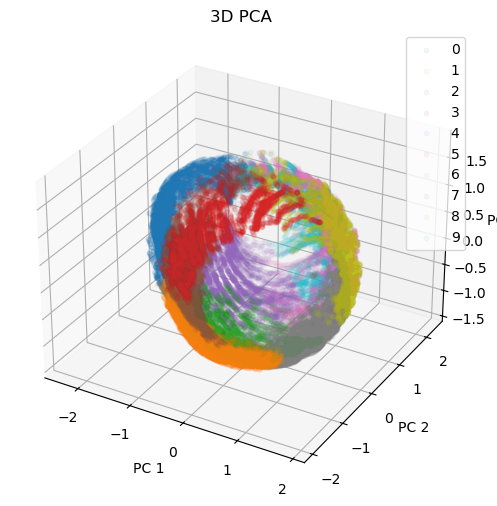

In [367]:
# 3. Create the 3D plot
fig = plt.figure(1, figsize=(8, 6))
ax = fig.add_subplot(111, projection="3d") # Use "3d" projection

# Color the points by target class
for cluster_idx in range(n_clusters):
    ax.scatter(
        states_3d[cluster_info['cluster_labels'] == cluster_idx, 0],
        states_3d[cluster_info['cluster_labels'] == cluster_idx, 1],
        states_3d[cluster_info['cluster_labels'] == cluster_idx, 2],
        label=cluster_idx,
        alpha=.05,
        # edgecolor='w',
        s=10,
    )

ax.set_title("3D PCA")
ax.set_xlabel("PC 1")
ax.set_ylabel("PC 2")
ax.set_zlabel("PC 3")
ax.legend()

plt.show()

In [ ]:
for i in range(ae_dat.n)

In [ ]:
# 3. Create the 3D plot
fig = plt.figure(1, figsize=(8, 6))
ax = fig.add_subplot(111, projection="3d") # Use "3d" projection

# Color the points by target class
for cluster_idx in range(n_clusters):
    ax.scatter(
        states_3d[cluster_info['cluster_labels'] == cluster_idx, 0],
        states_3d[cluster_info['cluster_labels'] == cluster_idx, 1],
        states_3d[cluster_info['cluster_labels'] == cluster_idx, 2],
        label=cluster_idx,
        alpha=.05,
        # edgecolor='w',
        s=10,
    )

ax.set_title("3D PCA")
ax.set_xlabel("PC 1")
ax.set_ylabel("PC 2")
ax.set_zlabel("PC 3")
ax.legend()

plt.show()

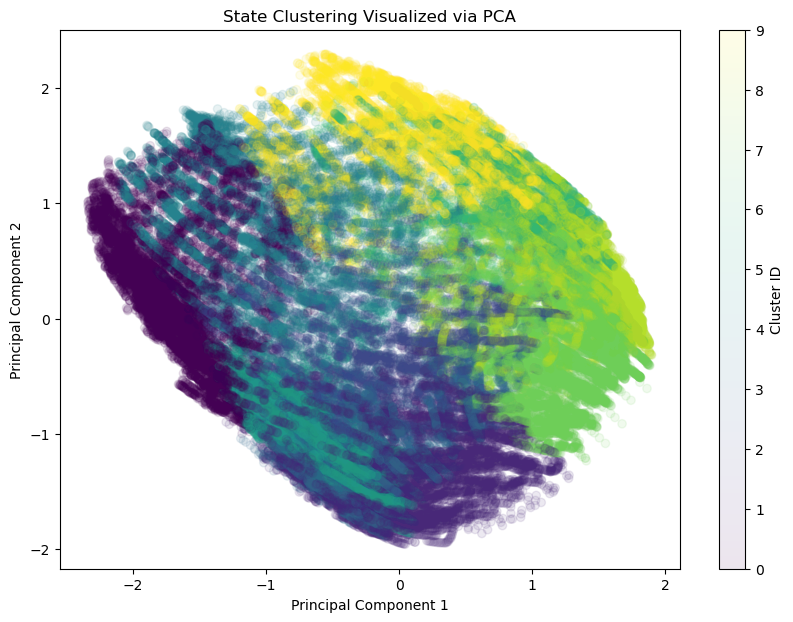

In [368]:
plt.figure(figsize=(10, 7))
scatter = plt.scatter(states_2d[:, 0], states_2d[:, 1], c=cluster_info['cluster_labels'], cmap='viridis', alpha=0.1)
plt.colorbar(scatter, label='Cluster ID')
plt.title('State Clustering Visualized via PCA')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.show()

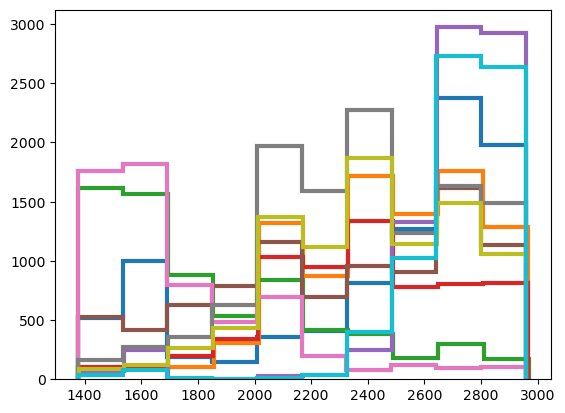

In [369]:
for i in range(n_clusters):
    plt.hist(cluster_info[i]['actions'], histtype='step', lw=3)
    # print(cluster_info[i]['centroids'])

In [370]:
cluster_labels = kmeans.predict(ae_dat.states.detach().numpy())

Text(0.5, 0, 'Cluster labels')

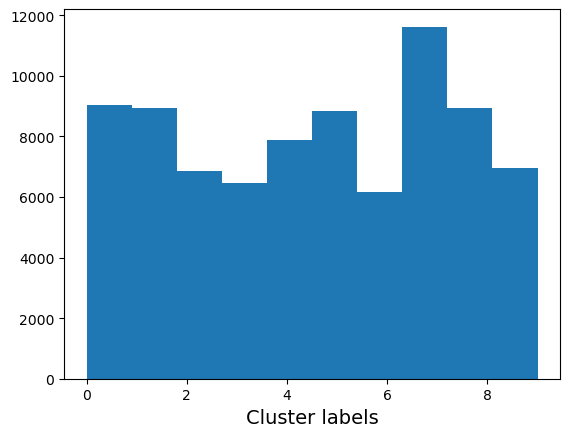

In [371]:
plt.hist(cluster_labels)
plt.xlabel('Cluster labels', fontsize=14)

In [372]:
import pandas as pd
import plotly.express as px

def visualize_cluster_profiles(states, cluster_labels, feature_names):
    # 1. Create a DataFrame from the scaled states
    df = pd.DataFrame(states, columns=feature_names)
    df['Cluster'] = cluster_labels
    
    # 2. Calculate the mean (centroid) for each cluster
    centroids = df.groupby('Cluster').mean().reset_index()
    
    # 3. Plot Parallel Coordinates
    # This allows you to see how each cluster varies across RA, Dec, Airmass, etc.
    fig = px.parallel_coordinates(
        centroids, 
        color="Cluster",
        labels={col: col for col in feature_names},
        width=2000,
    )
    fig.show()

# Usage: 
# feature_cols = ['ra', 'dec', 'airmass', 'az', 'el', 'hour_angle']
# visualize_cluster_profiles(states_scaled, cluster_labels, feature_cols)

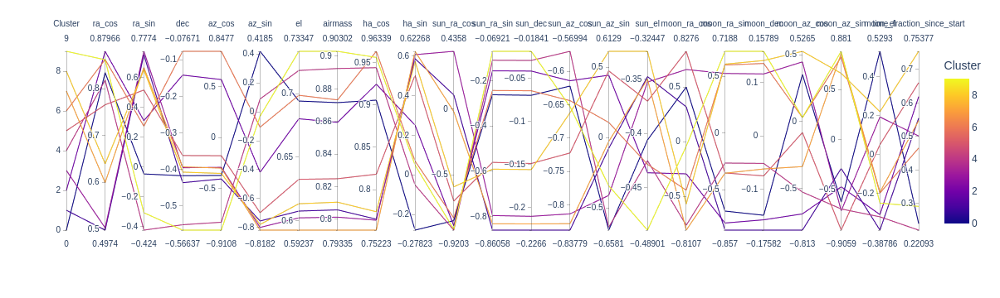

In [373]:
visualize_cluster_profiles(states=ae_states_np, cluster_labels=cluster_info['cluster_labels'], feature_names=ae_dat.state_feature_names)

In [374]:
from sklearn.metrics import silhouette_score
import matplotlib.pyplot as plt

def evaluate_silhouette(states, k_range):
    scores = []
    for k in k_range:
        model = KMeans(n_clusters=k, random_state=42, n_init=10)
        labels = model.fit_predict(states)
        score = silhouette_score(states, labels)
        scores.append(score)
        print(f"For k={k}, the average silhouette_score is : {score:.4f}")
    
    plt.figure(figsize=(8, 5))
    plt.plot(k_range, scores, 'ro-')
    plt.xlabel('Number of Clusters (k)')
    plt.ylabel('Silhouette Score')
    plt.title('Silhouette Method for Optimal k')
    plt.show()

# Run for the candidate range we identified in your plot
# evaluate_silhouette(states_scaled, [5, 8, 10, 12, 15])

For k=2, the average silhouette_score is : 0.1900
For k=3, the average silhouette_score is : 0.2048
For k=4, the average silhouette_score is : 0.1951
For k=5, the average silhouette_score is : 0.1903
For k=6, the average silhouette_score is : 0.1933
For k=7, the average silhouette_score is : 0.1963
For k=8, the average silhouette_score is : 0.2046
For k=9, the average silhouette_score is : 0.2050
For k=10, the average silhouette_score is : 0.2070
For k=11, the average silhouette_score is : 0.2116
For k=12, the average silhouette_score is : 0.2098
For k=13, the average silhouette_score is : 0.2074
For k=14, the average silhouette_score is : 0.2085
For k=15, the average silhouette_score is : 0.2137
For k=16, the average silhouette_score is : 0.2161
For k=17, the average silhouette_score is : 0.2087
For k=18, the average silhouette_score is : 0.2112
For k=19, the average silhouette_score is : 0.2124


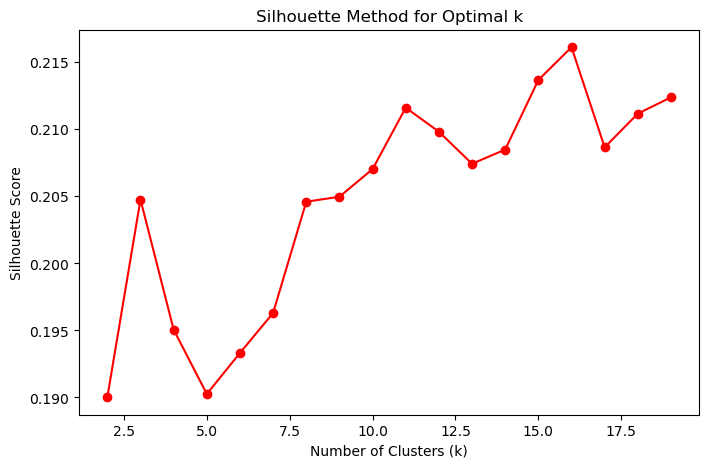

In [346]:
evaluate_silhouette(states=ae_states_np, k_range=np.arange(2, 20))

In [72]:
from sklearn.neighbors import NearestNeighbors
from collections import Counter

def measure_expert_consistency(states, actions, k=20):
    nn = NearestNeighbors(n_neighbors=k+1)
    nn.fit(states)
    distances, indices = nn.kneighbors(states)
    
    consistencies = []
    for i in range(len(states)):
        neighbor_actions = actions[indices[i, 1:]]  # exclude self
        most_common = Counter(neighbor_actions).most_common(1)[0]
        consistency = most_common[1] / k
        consistencies.append(consistency)
    
    return np.mean(consistencies)

NameError: name 'train_states' is not defined

In [74]:
k=2
NN = NearestNeighbors(n_neighbors=k)
NN.fit(ae_dat.states.detach().numpy())
distances, indices = NN.kneighbors(ae_dat.states.detach().numpy())

In [73]:
consistency = measure_expert_consistency(ae_dat.states.detach().numpy(), actions=ae_dat.actions.detach().numpy())
print(f"Expert consistency: {consistency:.3f}")
print(f"Theoretical max BC accuracy: ~{consistency * 0.6 + 0.2:.3f}")
print(f"Your current BC accuracy: 0.10")
print(f"Gap to optimal: {(consistency * 0.6 + 0.2) - 0.10:.3f}")

Expert consistency: 0.306
Theoretical max BC accuracy: ~0.384
Your current BC accuracy: 0.10
Gap to optimal: 0.284
